In [1]:
!pip install transformers datasets accelerate peft torch rouge-score bert-score nltk pandas scikit-learn

In [2]:
!pip install peft==0.6.0
!pip install --upgrade peft
!pip install bitsandbytes
!pip install shap

  Using cached peft-0.6.0-py3-none-any.whl.metadata (23 kB)
Using cached peft-0.6.0-py3-none-any.whl (134 kB)
  Attempting uninstall: peft
    Found existing installation: peft 0.15.1
    Uninstalling peft-0.15.1:
      Successfully uninstalled peft-0.15.1
  Using cached peft-0.15.1-py3-none-any.whl.metadata (13 kB)
Using cached peft-0.15.1-py3-none-any.whl (411 kB)
  Attempting uninstall: peft
    Found existing installation: peft 0.6.0
    Uninstalling peft-0.6.0:
      Successfully uninstalled peft-0.6.0


In [3]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to C:\Users\my pc/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
from datasets import load_dataset

# Load medical abstract dataset
train_data = load_dataset('csv', data_files='medical_tc_train.csv', split='train')
test_data = load_dataset('csv', data_files='medical_tc_test.csv', split='train')

In [5]:
from transformers import GPT2Tokenizer, GPT2LMHeadModel, AutoConfig
from peft import LoraConfig, get_peft_model, prepare_model_for_kbit_training
from transformers import pipeline
from transformers import DataCollatorForLanguageModeling
from transformers import Trainer, TrainingArguments
import torch


In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load GPT-2 model and tokenizer
model_name = "gpt2-large"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token  # Add padding token if necessary
config = AutoConfig.from_pretrained(model_name, output_attentions=True)

# Load GPT-2 model
model = GPT2LMHeadModel.from_pretrained(model_name, config=config)

# Prepare for LoRA adaptation
model = prepare_model_for_kbit_training(model)  # Prepares for low-rank adaptation (if necessary)

# LoRA configuration
lora_config = LoraConfig(
    task_type="CAUSAL_LM",   # Fine-tuning for causal language modeling
    r=8,                     # Low-rank parameter
    lora_alpha=32,           # Scaling parameter
    lora_dropout=0.1,        # Dropout to prevent overfitting
    target_modules=["c_attn", "c_proj"]  # Layers to adapt in GPT-2
)

# Apply LoRA to the model
model = get_peft_model(model, lora_config)
model.to(device)

C:\Users\my pc\.ai-navigator\micromamba\envs\cuda\Lib\site-packages\transformers\generation\configuration_utils.py:774: UserWarning: `return_dict_in_generate` is NOT set to `True`, but `output_attentions` is. When `return_dict_in_generate` is not `True`, `output_attentions` is ignored.
  warnings.warn(
C:\Users\my pc\.ai-navigator\micromamba\envs\cuda\Lib\site-packages\peft\tuners\lora\layer.py:1768: UserWarning: fan_in_fan_out is set to False but the target module is `Conv1D`. Setting fan_in_fan_out to True.
  warnings.warn(


PeftModelForCausalLM(
  (base_model): LoraModel(
    (model): GPT2LMHeadModel(
      (transformer): GPT2Model(
        (wte): Embedding(50257, 1280)
        (wpe): Embedding(1024, 1280)
        (drop): Dropout(p=0.1, inplace=False)
        (h): ModuleList(
          (0-35): 36 x GPT2Block(
            (ln_1): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
            (attn): GPT2SdpaAttention(
              (c_attn): lora.Linear(
                (base_layer): Conv1D(nf=3840, nx=1280)
                (lora_dropout): ModuleDict(
                  (default): Dropout(p=0.1, inplace=False)
                )
                (lora_A): ModuleDict(
                  (default): Linear(in_features=1280, out_features=8, bias=False)
                )
                (lora_B): ModuleDict(
                  (default): Linear(in_features=8, out_features=3840, bias=False)
                )
                (lora_embedding_A): ParameterDict()
                (lora_embedding_B): ParameterDict()
  

In [6]:
# Load GPT-2 model and tokenizer
model_name = "gpt2-large"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token  # Add padding token if necessary
def tokenize_function(examples):
    return tokenizer(
        examples['medical_abstract'], truncation=True, padding='max_length', max_length=128
    )

# Tokenize dataset
train_data = train_data.map(tokenize_function, batched=True)
test_data = test_data.map(tokenize_function, batched=True)

# Set format for PyTorch
train_data.set_format(type="torch", columns=["input_ids", "attention_mask"])
test_data.set_format(type="torch", columns=["input_ids", "attention_mask"])


In [30]:
# Data collator for causal language modeling
data_collator = DataCollatorForLanguageModeling(
    tokenizer=tokenizer, mlm=False  # mlm=False because we are doing causal LM
)
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=3,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=10,
    save_strategy="epoch",
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_data,
    eval_dataset=test_data,
    tokenizer=tokenizer,
    data_collator=data_collator,  # Use the collator here
)


# Train the model
trainer.train()


C:\Users\my pc\AppData\Local\Temp\ipykernel_6348\5329963.py:18: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss
1,2.694300,2.515540
2,2.613600,2.504536
3,2.623100,2.500968


TrainOutput(global_step=4332, training_loss=2.603949594365593, metrics={'train_runtime': 1068.1521, 'train_samples_per_second': 32.439, 'train_steps_per_second': 4.056, 'total_flos': 1.8959028092928e+16, 'train_loss': 2.603949594365593, 'epoch': 3.0})

In [31]:
# Save the LoRA-adapted model
model.save_pretrained("./lora_medical_gpt2")
tokenizer.save_pretrained("./lora_medical_gpt2")

# Evaluate
results = trainer.evaluate()
print(results)


{'eval_loss': 2.500967502593994, 'eval_runtime': 30.971, 'eval_samples_per_second': 93.249, 'eval_steps_per_second': 11.656, 'epoch': 3.0}


In [8]:
from transformers import AutoTokenizer, AutoModelForCausalLM, pipeline
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load the LoRA fine-tuned model and tokenizer
tokenizer = AutoTokenizer.from_pretrained("./lora_medical_gpt2")
#generator_model = pipeline("text-generation", model="./lora_medical_gpt2", tokenizer=tokenizer, device=0)
generator_model = AutoModelForCausalLM.from_pretrained("./lora_medical_gpt2").to(device)


In [20]:
!pip install rouge

In [45]:
import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
from nltk.translate.bleu_score import sentence_bleu
from rouge import Rouge
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load model and tokenizer
#tokenizer = AutoTokenizer.from_pretrained("gpt2")
#generator_model = AutoModelForCausalLM.from_pretrained("gpt2").to(device)

# Load the dataset
train_df = pd.read_csv("medical_tc_test.csv")
texts = train_df["medical_abstract"].tolist()

# Ensure tokenizer has a pad token
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# Create prompts from the first 50 words
prompts = [' '.join(str(text).split()[:50]) for text in texts]

def generate_long_text(model, tokenizer, prompt, max_length=300):    
    input_ids = tokenizer(prompt, return_tensors="pt").input_ids.to(device)
    output_ids = model.generate(input_ids, max_length=max_length, num_return_sequences=1, pad_token_id=tokenizer.eos_token_id)
    generated_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    return generated_text

def calculate_perplexity(model, tokenizer, text):
    input_ids = tokenizer(text, return_tensors="pt").input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    return torch.exp(loss).item()

def evaluate_generated_texts(reference_text, generated_text):
    reference_list = reference_text.split()
    generated_list = generated_text.split()

    # BLEU Score
    bleu_score = sentence_bleu([reference_list], generated_list)

    # ROUGE Scores
    rouge = Rouge()
    rouge_scores = rouge.get_scores(generated_text, reference_text)[0]
    P = rouge_scores['rouge-l']['p']
    R = rouge_scores['rouge-l']['r']
    F1 = rouge_scores['rouge-l']['f']

    # Cosine Similarity
    vectorizer = CountVectorizer().fit_transform([reference_text, generated_text])
    vectors = vectorizer.toarray()
    cos_sim = cosine_similarity(vectors)[0][1]

    return bleu_score, rouge_scores, P, R, F1, cos_sim

# Evaluation Loop
total_bleu, total_rougeL, total_perplexity, total_sim = 0, 0, 0, 0
for i, prompt in enumerate(prompts):
    reference_text = texts[i]
    generated_text_str = generate_long_text(generator_model, tokenizer, prompt, max_length=500)
    
    print(f"Reference Text: {reference_text}")
    print(f"Generated Text: {generated_text_str}")

    bleu_score, rouge_scores, P, R, F1, cos_sim = evaluate_generated_texts(reference_text, generated_text_str)
    perplexity = calculate_perplexity(generator_model, tokenizer, generated_text_str)

    print(f"BLEU: {bleu_score}, ROUGE-L: {rouge_scores['rouge-l']}, Perplexity: {perplexity}, Cosine Similarity: {cos_sim:.4f}")
    
    # Accumulate scores
    total_bleu += bleu_score
    total_rougeL += rouge_scores['rouge-l']['f']
    total_perplexity += perplexity
    total_sim += cos_sim

# Averages
num_samples = len(prompts)
print("Average BLEU:", total_bleu / num_samples)
print("Average ROUGE-L:", total_rougeL / num_samples)
print("Average Perplexity:", total_perplexity / num_samples)
print("Average Cosine Similarity:", total_sim / num_samples)


C:\Users\my pc\.ai-navigator\micromamba\envs\cuda\Lib\site-packages\huggingface_hub\file_download.py:139: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\my pc\.cache\huggingface\hub\models--gpt2. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a conseq

Reference Text: Obstructive sleep apnea following topical oropharyngeal anesthesia in loud snorers. Previous studies support the presence of an upper airway reflex mechanism that contributes to the maintenance of upper airway patency during sleep. We investigated the possibility that interference with this reflex mechanism contributes to the development of obstructive sleep apnea. Eight otherwise asymptomatic snorers (seven male and one female), age 39 +/- 5.3 yr (mean +/- SEM), underwent overnight sleep studies on three successive nights. An acclimatization night was followed by two study nights randomly assigned to control (C) and oropharyngeal anesthesia (OPA). On the OPA night topical anesthesia was induced using 10% lidocaine spray and 0.25% bupivacaine gargle. A saline placebo was used on night C. All subjects slept well on both study nights (mean sleep duration was 6.2 h on both study nights), and sleep stage distribution was similar on both nights. Obstructive apneas and hypopn

In [46]:
torch.cuda.empty_cache()

The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


Sample 0: Perplexity = 2.0467
Sample 1: Perplexity = 3.1442
Sample 2: Perplexity = 3.0633
Sample 3: Perplexity = 2.7572
Sample 4: Perplexity = 2.7497
Sample 5: Perplexity = 2.8878
Sample 6: Perplexity = 2.2010
Sample 7: Perplexity = 3.6397
Sample 8: Perplexity = 2.6307
Sample 9: Perplexity = 1.8173
Sample 10: Perplexity = 2.0476
Sample 11: Perplexity = 1.8278
Sample 12: Perplexity = 2.6154
Sample 13: Perplexity = 1.9888
Sample 14: Perplexity = 3.0847
Sample 15: Perplexity = 2.0342
Sample 16: Perplexity = 2.2005
Sample 17: Perplexity = 2.2334
Sample 18: Perplexity = 2.8563
Sample 19: Perplexity = 2.4592
Sample 20: Perplexity = 2.3992
Sample 21: Perplexity = 1.7662
Sample 22: Perplexity = 2.8621
Sample 23: Perplexity = 2.1495
Sample 24: Perplexity = 2.2372
Sample 25: Perplexity = 2.3534
Sample 26: Perplexity = 2.7488
Sample 27: Perplexity = 2.8305
Sample 28: Perplexity = 1.9159
Sample 29: Perplexity = 2.4427
Sample 30: Perplexity = 2.0809
Sample 31: Perplexity = 2.8557
Sample 32: Perplex

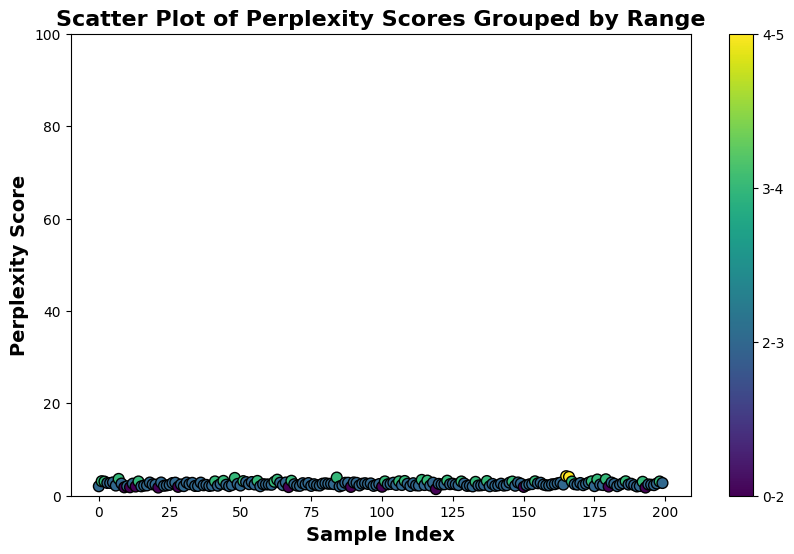

In [9]:
import pandas as pd
import torch
import matplotlib.pyplot as plt
from transformers import AutoTokenizer, AutoModelForCausalLM
from nltk.translate.bleu_score import sentence_bleu
from rouge import Rouge
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load the dataset
train_df = pd.read_csv("medical_tc_test.csv")
texts = train_df["medical_abstract"][:200].tolist()

# Ensure tokenizer has a pad token
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# Create prompts from the first 50 words
prompts = [' '.join(str(text).split()[:50]) for text in texts]

def generate_long_text(model, tokenizer, prompt, max_length=300):    
    input_ids = tokenizer(prompt, return_tensors="pt").input_ids.to(device)
    output_ids = model.generate(input_ids, max_length=max_length, pad_token_id=tokenizer.eos_token_id)
    generated_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    return generated_text

def calculate_perplexity(model, tokenizer, text):
    input_ids = tokenizer(text, return_tensors="pt").input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    return torch.exp(loss).item()

# Loop over prompts, generate text, and record perplexity scores
perplexity_scores = []
for i, prompt in enumerate(prompts):
    generated_text_str = generate_long_text(generator_model, tokenizer, prompt, max_length=300)
    perplexity = calculate_perplexity(generator_model, tokenizer, generated_text_str)
    perplexity_scores.append(perplexity)
    print(f"Sample {i}: Perplexity = {perplexity:.4f}")

# Save perplexity scores to a CSV file
df = pd.DataFrame({
    "Index": range(len(perplexity_scores)),
    "Perplexity": perplexity_scores
})
df.to_csv("lora_med_gpt_perplexity_scores.csv", index=False)
print("Perplexity scores saved to perplexity_scores.csv")

# Group perplexity scores into defined ranges.
# For this example, we group scores as: 0-20, 20-40, 40-60, 60-80, 80-100, and 100+
bins = [0,2,3,4,5,6,7,8,9,10,20, 40, 60, 80, 100, float('inf')]
labels = ["0-2", "2-3","3-4","4-5","5-6","6-7","7-8","8-9","9-10","10-20","20-40", "40-60", "60-80", "80-100", "100+"]
df["Perplexity Group"] = pd.cut(df["Perplexity"], bins=bins, labels=labels)



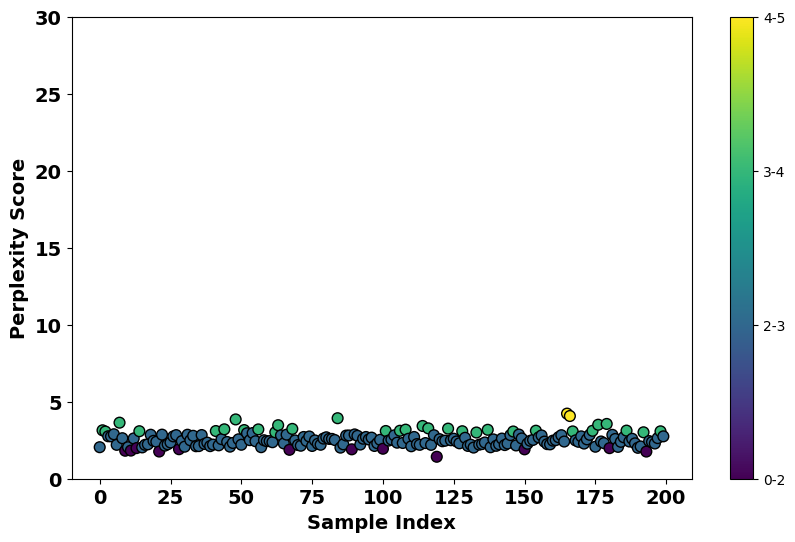

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("lora_med_gpt_perplexity_scores.csv")
# Group perplexity scores into defined ranges.
# For this example, we group scores as: 0-20, 20-40, 40-60, 60-80, 80-100, and 100+
bins = [0,2,3,4,5,6,7,8,9,10,20, 40, 60, 80, 100, float('inf')]
labels = ["0-2", "2-3","3-4","4-5","5-6","6-7","7-8","8-9","9-10","10-20","20-40", "40-60", "60-80", "80-100", "100+"]
df["Perplexity Group"] = pd.cut(df["Perplexity"], bins=bins, labels=labels)
# Create a scatter plot of perplexity scores.
plt.figure(figsize=(10, 6))
# Color-code by perplexity group using categorical codes.
scatter = plt.scatter(df["Index"], df["Perplexity"], 
                      c=df["Perplexity Group"].cat.codes, cmap="viridis", s=60, edgecolor="k")
plt.xlabel("Sample Index", fontweight="bold", fontsize=14)
plt.ylabel("Perplexity Score", fontweight="bold", fontsize=14)
plt.xticks(fontsize=14, fontweight='bold')  # Increase font size and make it bold
plt.yticks(fontsize=14, fontweight='bold')  # Increase font size and make it bold

plt.title("", fontweight="bold", fontsize=16)

# Fix y-axis range from 0 to 100
plt.ylim(0, 30)

# Create a colorbar with group labels.
cbar = plt.colorbar(scatter, ticks=range(len(labels)))
cbar.ax.set_yticklabels(labels)
plt.savefig("lora_med_gpt_perplexity_scatter_plot.png", dpi=300, bbox_inches="tight")
plt.show()


In [10]:
import numpy as np
np.mean(perplexity_scores)

2.5513009548187258

In [53]:
!pip install lightgbm

   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   ---------------------------------------- 1.4/1.4 MB 25.2 MB/s eta 0:00:00


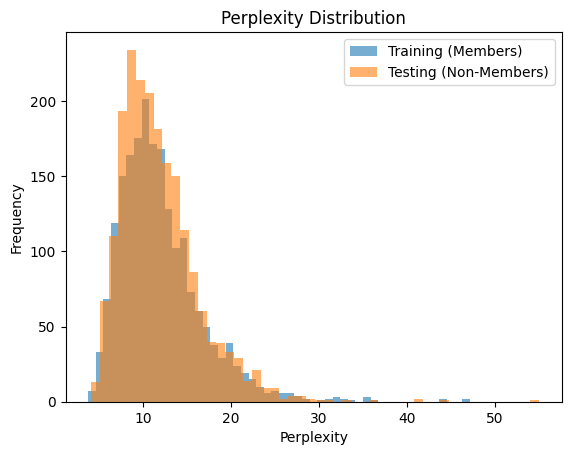

[LightGBM] [Info] Number of positive: 1578, number of negative: 1622
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 3200, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
Classification Report:
              precision    recall  f1-score   support

           0       0.44      0.52      0.48       378
           1       0.48      0.40      0.44       422

    accuracy                           0.46       800
   macro avg       0.46      0.46      0.46       800
weighted avg       0.46      0.46      0.45       800



In [60]:
import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Set up device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load your datasets
train_df = pd.read_csv("medical_tc_train.csv")  # Adjust file name if necessary
test_df = pd.read_csv("medical_tc_test.csv")    # Adjust file name if necessary

# Extract texts
train_texts = train_df["medical_abstract"][:2000].tolist()  # Adjust column name if needed
test_texts = test_df["medical_abstract"][:2000].tolist()    # Adjust column name if needed

# Function to calculate perplexity for a single text
def calculate_perplexity(model, tokenizer, text, device):       
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    return torch.exp(loss).item()

# Function to calculate perplexities for a list of texts
def calculate_perplexities(model, tokenizer, texts, device):
    perplexities = []
    for text in texts:
        perplexity = calculate_perplexity(model, tokenizer, text, device)
        perplexities.append(perplexity)        
    return perplexities

# Calculate perplexities for training and test datasets
train_perplexities = calculate_perplexities(generator_model, tokenizer, train_texts, device)
test_perplexities = calculate_perplexities(generator_model, tokenizer, test_texts, device)

# Combine perplexities and prepare labels
labels = [1] * len(train_perplexities) + [0] * len(test_perplexities)
perplexities = train_perplexities + test_perplexities

# Visualize perplexity distributions
plt.hist(train_perplexities, bins=50, alpha=0.6, label="Training (Members)")
plt.hist(test_perplexities, bins=50, alpha=0.6, label="Testing (Non-Members)")
plt.xlabel("Perplexity")
plt.ylabel("Frequency")
plt.legend()
plt.title("Perplexity Distribution")

plt.show()

# Prepare data for membership inference model
X = np.array(perplexities).reshape(-1, 1)
y = np.array(labels)

# Split into training and testing sets for the inference model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a logistic regression model
#clf = LogisticRegression()
#clf.fit(X_train, y_train)

# Predict and evaluate
#y_pred = clf.predict(X_test)
#print(classification_report(y_test, y_pred))
# Train a LightGBM model
clf = LGBMClassifier(
    boosting_type="gbdt",
    num_leaves=31,          # Controls the complexity of the model
    learning_rate=0.1,      # Step size for optimization
    n_estimators=100,       # Number of boosting rounds
    class_weight="balanced" # Automatically handle class imbalance
)
clf.fit(X_train, y_train)

# Predict and evaluate
y_pred = clf.predict(X_test)
y_pred_prob = clf.predict_proba(X_test)[:, 1]  # Get probabilities for ROC-AUC calculation

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))



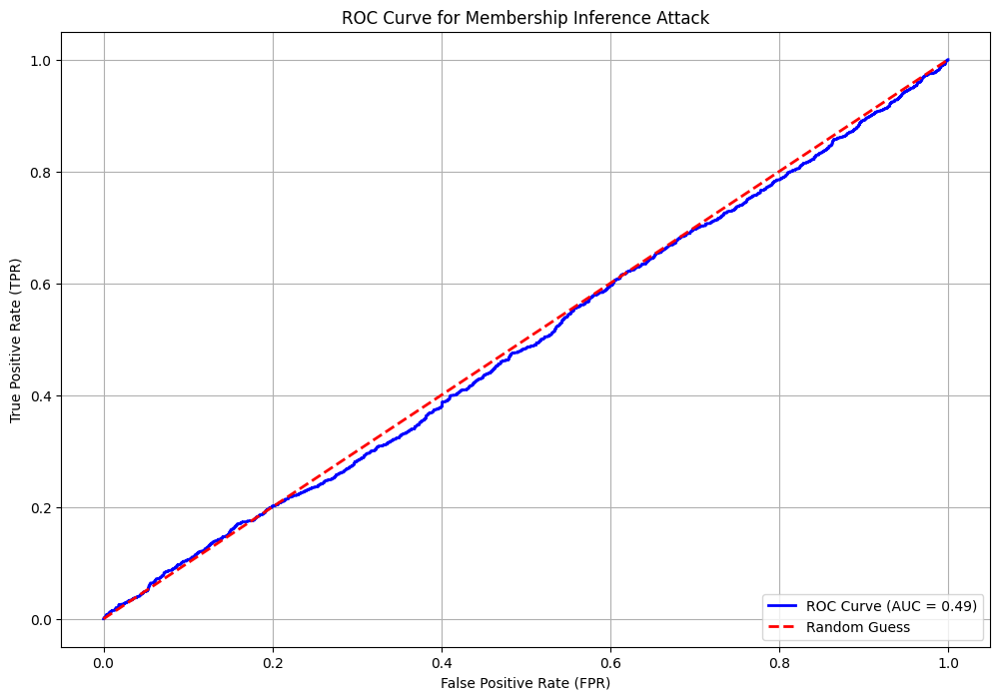

In [62]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(labels, -np.array(perplexities))  # Use negative perplexity for descending order

# Compute the Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot the ROC Curve
plt.figure(figsize=(12, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='red', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curve for Membership Inference Attack")
plt.legend(loc="lower right")
plt.grid()
plt.show()

[LightGBM] [Info] Number of positive: 79, number of negative: 81
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 216
[LightGBM] [Info] Number of data points in the train set: 160, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

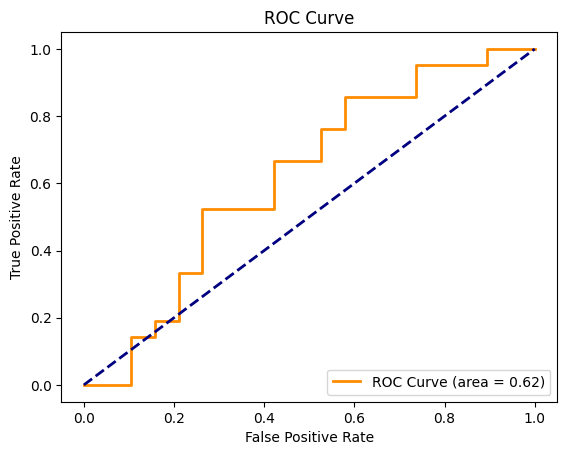

In [9]:
import numpy as np
import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from lightgbm import LGBMClassifier
from scipy.stats import entropy
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Set up device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load datasets
train_df = pd.read_csv("medical_tc_train.csv")  # Adjust file name if necessary
test_df = pd.read_csv("medical_tc_test.csv")    # Adjust file name if necessary

train_texts = train_df["medical_abstract"][:100].tolist()
test_texts = test_df["medical_abstract"][:100].tolist()

# Function to calculate perplexity
def calculate_perplexity(model, tokenizer, text, device):
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    return torch.exp(loss).item()

# Function to calculate prediction confidence
def calculate_prediction_confidence(model, tokenizer, text, device):
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids)
        probabilities = torch.softmax(outputs.logits, dim=-1)
        return probabilities.max().item()

# Function to calculate entropy
def calculate_entropy(model, tokenizer, text, device):
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids)
        probabilities = torch.softmax(outputs.logits, dim=-1)
        return entropy(probabilities.cpu().numpy().flatten())

# Function to calculate feature representation distance
def calculate_feature_representation_distance(model, tokenizer, text, centroid, device):
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        embeddings = model.transformer.wte(input_ids).mean(dim=1).cpu().numpy()
    return np.linalg.norm(embeddings - centroid)

# Calculate centroid for training set embeddings
def calculate_centroid(model, tokenizer, texts, device):
    embeddings = []
    for text in texts:
        input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
        with torch.no_grad():
            embedding = model.transformer.wte(input_ids).mean(dim=1).cpu().numpy()
        embeddings.append(embedding)
    return np.mean(embeddings, axis=0)

# Calculate centroid for training texts
train_centroid = calculate_centroid(generator_model, tokenizer, train_texts, device)
test_centroid = calculate_centroid(generator_model, tokenizer, test_texts, device)

# Calculate features for training and test texts
def calculate_features(model, tokenizer, texts, centroid, device):
    perplexities, confidences, entropies, frd_distances = [], [], [], []
    for text in texts:
        perplexities.append(calculate_perplexity(model, tokenizer, text, device))
        confidences.append(calculate_prediction_confidence(model, tokenizer, text, device))
        entropies.append(calculate_entropy(model, tokenizer, text, device))
        frd_distances.append(calculate_feature_representation_distance(model, tokenizer, text, centroid, device))
    return perplexities, confidences, entropies, frd_distances

train_features = calculate_features(generator_model, tokenizer, train_texts, train_centroid, device)
test_features = calculate_features(generator_model, tokenizer, test_texts, test_centroid, device)

# Combine features and labels
train_labels = [1] * len(train_texts)  # Members
test_labels = [0] * len(test_texts)    # Non-members

combined_features = np.vstack((
    np.column_stack(train_features),
    np.column_stack(test_features)
))
combined_labels = np.array(train_labels + test_labels)

# Normalize features
scaler = MinMaxScaler()
normalized_features = scaler.fit_transform(combined_features)

# Split data for training the attack model
X_train, X_test, y_train, y_test = train_test_split(normalized_features, combined_labels, test_size=0.2, random_state=42)

# Train LightGBM attack model
clf = LGBMClassifier(class_weight="balanced", learning_rate=0.1, n_estimators=100)
clf.fit(X_train, y_train)

# Evaluate the attack model
y_pred = clf.predict(X_test)
y_pred_prob = clf.predict_proba(X_test)[:, 1]

print("Classification Report:")
print(classification_report(y_test, y_pred))

roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"ROC-AUC: {roc_auc:.2f}")

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure()
plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC Curve (area = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()


In [13]:
import numpy as np
import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from scipy.stats import entropy
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import csv

# Set up device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
count=1
# Ensure tokenizer has a pad token
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# Load datasets
train_df = pd.read_csv("medical_tc_train.csv")  # Adjust file name if necessary
test_df = pd.read_csv("medical_tc_test.csv")    # Adjust file name if necessary

train_texts = train_df["medical_abstract"][:200].tolist()
test_texts = test_df["medical_abstract"][:200].tolist()

def generate_long_text(model, tokenizer, prompt, max_length=300):    
    input_ids = tokenizer(prompt, return_tensors="pt").input_ids.to(device)
    output_ids = model.generate(input_ids, max_length=max_length, pad_token_id=tokenizer.eos_token_id)
    generated_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    return generated_text

# Function to calculate perplexity
def calculate_perplexity(model, tokenizer, text, device):
    global count
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    count = count+1
    print(count)
    return torch.exp(loss).item()

# Function to calculate prediction confidence
def calculate_prediction_confidence(model, tokenizer, text, device):
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids)
        probabilities = torch.softmax(outputs.logits, dim=-1)
        return probabilities.max().item()

# Function to calculate entropy
def calculate_entropy(model, tokenizer, text, device):
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        outputs = model(input_ids)
        probabilities = torch.softmax(outputs.logits, dim=-1)
        return entropy(probabilities.cpu().numpy().flatten())

# Function to calculate feature representation distance
def calculate_feature_representation_distance(model, tokenizer, text, centroid, device):
    input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
    with torch.no_grad():
        embeddings = model.transformer.wte(input_ids).mean(dim=1).cpu().numpy()
    return np.linalg.norm(embeddings - centroid)

# Calculate centroid for training set embeddings
def calculate_centroid(model, tokenizer, texts, device):
    embeddings = []
    for text in texts:
        input_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True).input_ids.to(device)
        with torch.no_grad():
            embedding = model.transformer.wte(input_ids).mean(dim=1).cpu().numpy()
        embeddings.append(embedding)
    return np.mean(embeddings, axis=0)

# Calculate centroid for training texts
train_centroid = calculate_centroid(generator_model, tokenizer, train_texts, device)
test_centroid = calculate_centroid(generator_model, tokenizer, test_texts, device)

# Calculate features for training and test texts
def calculate_features(model, tokenizer, texts, centroid, device):
    perplexities, confidences, entropies, frd_distances = [], [], [], []
    for text in texts:
        prompt = ' '.join(str(text).split()[:50])
        #print(prompt)
        text = generate_long_text(model, tokenizer, prompt, max_length=300)
        perplexities.append(calculate_perplexity(model, tokenizer, text, device))
        confidences.append(calculate_prediction_confidence(model, tokenizer, text, device))
        entropies.append(calculate_entropy(model, tokenizer, text, device))
        frd_distances.append(calculate_feature_representation_distance(model, tokenizer, text, centroid, device))
    return perplexities, confidences, entropies, frd_distances

# Open CSV file to store results
csv_filename = "lora_med_txt_gen_attack_model_results_new.csv"
with open(csv_filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerow(["Run", "Precision", "Recall", "F1-Score", "ROC-AUC"])
    
    for run in range(1, 11):  # Run 10 times
        print(f"Run {run}...")      
        train_features = calculate_features(generator_model, tokenizer, train_texts, train_centroid, device)
        test_features = calculate_features(generator_model, tokenizer, test_texts, test_centroid, device)
    
        # Combine features and labels
        train_labels = [1] * len(train_texts)  # Members
        test_labels = [0] * len(test_texts)    # Non-members
    
        combined_features = np.vstack((
            np.column_stack(train_features),
            np.column_stack(test_features)
        ))
        combined_labels = np.array(train_labels + test_labels)
        # Normalize features
        scaler = MinMaxScaler()
        normalized_features = scaler.fit_transform(combined_features)        
        # Split data for training the attack model
        X_train, X_test, y_train, y_test = train_test_split(combined_features, combined_labels, test_size=0.2, random_state=42 + run)
        # Define base classifiers
        rf_clf = RandomForestClassifier(n_estimators=100, class_weight="balanced", random_state=42)
        lgbm_clf = LGBMClassifier(class_weight="balanced", learning_rate=0.1, n_estimators=100)
        lr_clf = LogisticRegression(class_weight="balanced", max_iter=500)
        
        # Combine classifiers using Voting
        ensemble_clf = VotingClassifier(
            estimators=[("rf", rf_clf), ("lgbm", lgbm_clf), ("lr", lr_clf)],
            voting="soft"  # Use soft voting (probabilities) instead of hard voting (majority class)
        )
        
        # Train ensemble model
        ensemble_clf.fit(X_train, y_train)
        
        # Evaluate the attack model
        y_pred = ensemble_clf.predict(X_test)
        y_pred_prob = ensemble_clf.predict_proba(X_test)[:, 1]
        report = classification_report(y_test, y_pred, output_dict=True)
        precision = report["macro avg"]["precision"]
        recall = report["macro avg"]["recall"]
        f1_score = report["macro avg"]["f1-score"]
        roc_auc = roc_auc_score(y_test, y_pred_prob)

        print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1_score:.4f}, ROC-AUC: {roc_auc:.4f}")

        # Save to CSV
        writer.writerow([run, precision, recall, f1_score, roc_auc])

print(f"Results saved to {csv_filename}")


Run 1...
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
[LightGBM] [Info] Number of positive: 76, number of negative: 84
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 219
[LightGBM] [Info] Number of data poin

In [10]:
!pip install seaborn

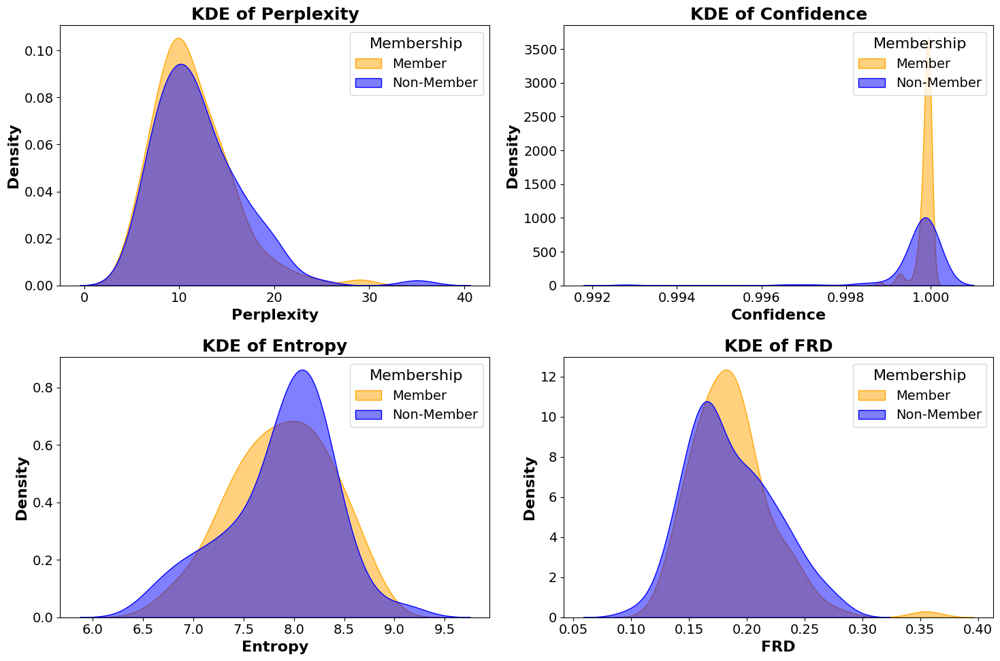

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Extract individual feature arrays
train_perplexities, train_confidences, train_entropies, train_frd = train_features
test_perplexities, test_confidences, test_entropies, test_frd = test_features

# Combine train and test features for each category
perplexities = np.concatenate([train_perplexities, test_perplexities])
confidences = np.concatenate([train_confidences, test_confidences])
entropies = np.concatenate([train_entropies, test_entropies])
frd_distances = np.concatenate([train_frd, test_frd])

# Combine member (1) and non-member (0) labels
labels = np.concatenate([[1] * len(train_perplexities), [0] * len(test_perplexities)])

df = pd.DataFrame({
    "Perplexity": perplexities,
    "Confidence": confidences,
    "Entropy": entropies,
    "FRD": frd_distances,
    "Membership": labels
})

# Convert Membership to categorical for seaborn
df["Membership"] = df["Membership"].map({1: "Member", 0: "Non-Member"})
# Set global font settings
plt.rcParams.update({
    "font.size": 16,      # Increase font size
    "axes.labelweight": "bold",
    "axes.titleweight": "bold",
    "axes.titlesize": 18,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "legend.title_fontsize": 16,
    "axes.labelsize": 16,
})
# Plot KDE for each feature
features = ["Perplexity", "Confidence", "Entropy", "FRD"]
plt.figure(figsize=(15, 10))

for i, feature in enumerate(features, 1):
    plt.subplot(2, 2, i)
    sns.kdeplot(data=df, x=feature, hue="Membership", fill=True, common_norm=False, alpha=0.5, palette={"Member": "blue", "Non-Member": "orange"} )
    plt.title(f"KDE of {feature}",fontweight="bold",fontsize=18)
    plt.xlabel(feature,fontweight="bold",fontsize=16)
    plt.ylabel("Density",fontweight="bold",fontsize=16)
    plt.legend(
        title="Membership", 
        loc="upper right", 
        labels=["Member", "Non-Member"], 
        frameon=True
    )

plt.tight_layout()
plt.savefig("lora_med_txt_gen_kde_plots.jpg", dpi=300, bbox_inches="tight")
plt.show()


In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import shap

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

generator_model.to(device)
generator_model.eval()
PROMPT_LENGTH=50
def tokenize_text(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True)
    return inputs

def decode_tokens(tokens):
    return [tokenizer.decode([token]) for token in tokens]

def compute_shap_values(model, tokenizer, text, max_length=300):
    inputs = tokenize_text(text)
    input_ids = inputs["input_ids"].to(device)  # Extract the 'input_ids' tensor
    #print(f"INPUT IDS: {input_ids} and SHAPE: {input_ids.shape}")
    # Generate synthetic texts with prompts (subset of input_ids)
    prompts = input_ids[:, :PROMPT_LENGTH]  # Slice to use only the first 50 tokens as the prompt
    generated_ids = model.generate(input_ids=prompts,max_length=300+10,do_sample=True,top_k=90,temperature=0.8,top_p=0.95, num_beams=8, 
                                       no_repeat_ngram_size=4,early_stopping=True, repetition_penalty=1.5, length_penalty=1.0,
                                       pad_token_id=tokenizer.pad_token_id,eos_token_id=tokenizer.eos_token_id)
    #input_texts = tokenizer.batch_decode(input_ids, skip_special_tokens=True)      
    tokens = tokenizer.tokenize(text)
    input_texts_np = np.array(tokens).reshape(-1, 1)
    #print(f"INPUT IDS: {input_texts_np} and SHAPE: {input_texts_np.shape}")
    explainer = shap.KernelExplainer(
           lambda texts: model(**tokenizer(list(texts.flatten()), return_tensors="pt", 
                                                      padding=True, truncation=True).to(device)).logits[:, -1, :].cpu().detach().numpy(), input_texts_np  # Baseline as 2D NumPy array
    )
    #shap_values = explainer.shap_values(input_texts_np, nsamples=100)
    #token_importances = np.mean(np.abs(shap_values), axis=-1).flatten()
    #print(f"TOKEN IMP: {token_importances}")
    shap_texts = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)   
    print(shap_texts[0])
    gen_inputs = tokenize_text(shap_texts[0])
    gen_input_ids = gen_inputs["input_ids"].to(device)  # Extract the 'input_ids' tensor    
    gen_tokens = tokenizer.tokenize(shap_texts[0])
    shap_texts_np = np.array(gen_tokens).reshape(-1, 1) 
    shap_values = explainer.shap_values(shap_texts_np, nsamples=100)    
    return shap_texts[0], shap_values
text = "Obstructive sleep apnea following topical oropharyngeal anesthesia in loud snorers. Previous studies support the presence of an upper airway reflex mechanism that contributes to the maintenance of upper airway patency during sleep. We investigated the possibility that interference with this reflex mechanism contributes to the development of obstructive sleep apnea. Eight otherwise asymptomatic snorers (seven male and one female), age 39 +/- 5.3 yr (mean +/- SEM), underwent overnight sleep studies on three successive nights. An acclimatization night was followed by two study nights randomly assigned to control (C) and oropharyngeal anesthesia (OPA). On the OPA night topical anesthesia was induced using 10% lidocaine spray and 0.25% bupivacaine gargle. A saline placebo was used on night C. All subjects slept well on both study nights (mean sleep duration was 6.2 h on both study nights), and sleep stage distribution was similar on both nights. Obstructive apneas and hypopneas (OAH) rose from 114 +/- 43 during C to 170 +/- 49 during OPA (p less than 0.02). Central apneas and hypopneas (CAH) were unchanged between the two nights (8 +/- 4.9 versus 7 +/- 3). The duration of OAH was similar on both study nights (20 +/- 1.9 s during C versus 20 +/- 1.5 s during OPA). The frequency of movement arousals terminating OAH tended to be higher during OPA (7 +/- 2.9/h) than during C (3 +/- 0.7); P = NS. The frequency of oxyhemoglobin desaturations was also higher during OPA (5 +/- 2.1/h) than during C (3 +/- 1.4), p less than 0.07."
# Compute SHAP values for tokens
text, shap_values = compute_shap_values(generator_model, tokenizer, text)
#print(f"Raw SHAP values:{shap_values} SHAPE:{shap_values.shape}")
# Extract token importance
#token_importances = np.mean(np.abs(shap_values), axis=-1).flatten()
token_importances = np.mean(shap_values, axis=-1).flatten()
# Decode tokens
tokens = decode_tokens(tokenizer(text, return_tensors="pt")["input_ids"][0].tolist())
print(len(tokens))
print(len(token_importances))
#for i, (token, importance) in enumerate(zip(tokens, token_importances)):
#    #if i < 10:  # Limit to the first 10 for debug purposes
#    print(f"I:  {i} Token: {token} | SHAP Value: {importance}")




The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Using 379 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Obstructive sleep apnea following topical oropharyngeal anesthesia in loud snorers. Previous studies support the presence of an upper airway reflex mechanism that contributes to the maintenance of upper airway patency during sleep. We investigated the possibility that obstructive sleep apnoea (OSA) following topical oopharyngeal anaesthesia may be a consequence of this lower airway reflex. Twenty-eight patients with snoring were randomly divided into two groups. The first group was treated with lidocaine 0.5 mg/kg, followed by lidocaine 1 mg/kg and lidocaine 2 mg/kg. The second group was given lidocaine 5 mg/kg twice a day for 7 days. At the end of the 7-day treatment period, there was no significant difference in OSA between the two groups. However, there was a significant decrease in OSA in the first group compared with the second group (p less than 0.05). These results suggest that the lower airway response to lidocaine may contribute to the development of OSA.  The authors conclude

100%|██████████| 310/310 [00:16<00:00, 18.52it/s]


310
310


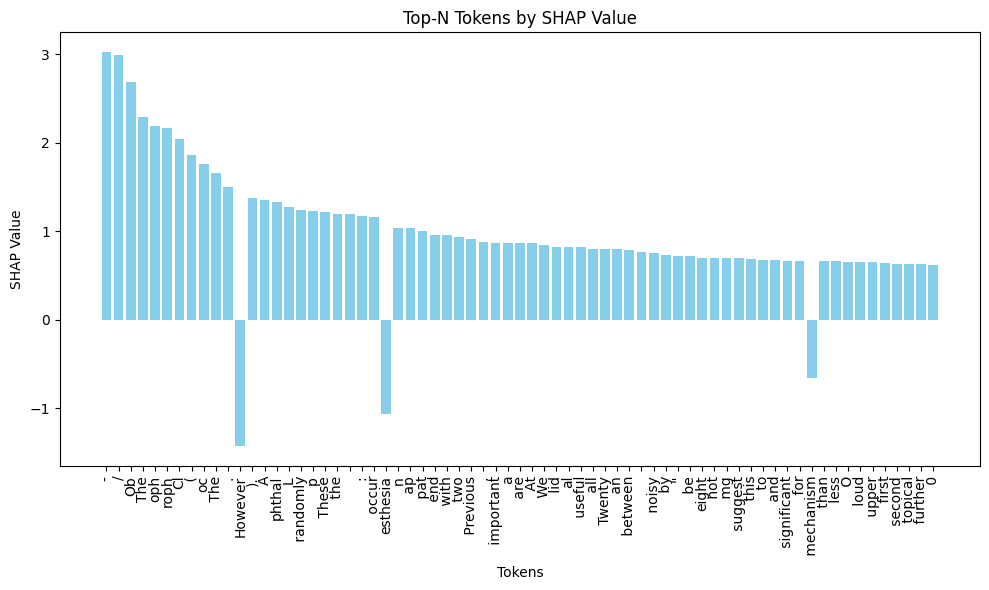

In [19]:
# Initialize empty lists for tokens and SHAP values
tokens_list = []
shap_values_list = []

# Iterate through the tokens and their corresponding SHAP values
for i, (token, importance) in enumerate(zip(tokens, token_importances)):
    # Add token and importance to the lists
    tokens_list.append(token)
    shap_values_list.append(importance)

# Create a list of tuples (token, shap_value) and sort by shap_value in descending order
sorted_tokens_shap = sorted(zip(tokens_list, shap_values_list), key=lambda x: abs(x[1]), reverse=True)

# Get the top 50 tokens and SHAP values
top_50_tokens, top_50_shap_values = zip(*sorted_tokens_shap[:150])

# Plotting the top 50 SHAP values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(top_50_tokens, top_50_shap_values, color='skyblue')
plt.xlabel('Tokens')
plt.ylabel('SHAP Value')
plt.xticks(rotation=90)
plt.title('Top-N Tokens by SHAP Value')
plt.tight_layout()  # Adjust layout to avoid overlapping labels
plt.show()


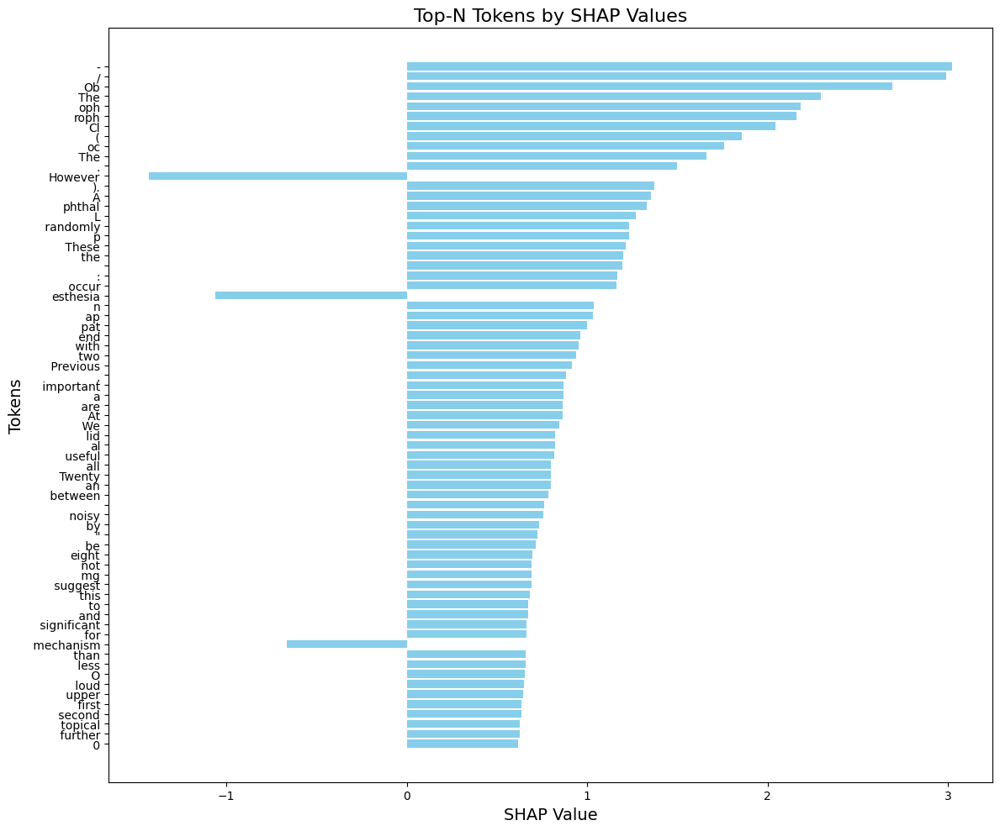

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Plot the bar chart
plt.figure(figsize=(12, 10))
plt.barh(top_50_tokens, top_50_shap_values, color="skyblue")
plt.xlabel("SHAP Value", fontsize=14)
plt.ylabel("Tokens", fontsize=14)
plt.title("Top-N Tokens by SHAP Values", fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to display highest SHAP value at the top
plt.tight_layout()
plt.show()


`GPT2SdpaAttention` is used but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


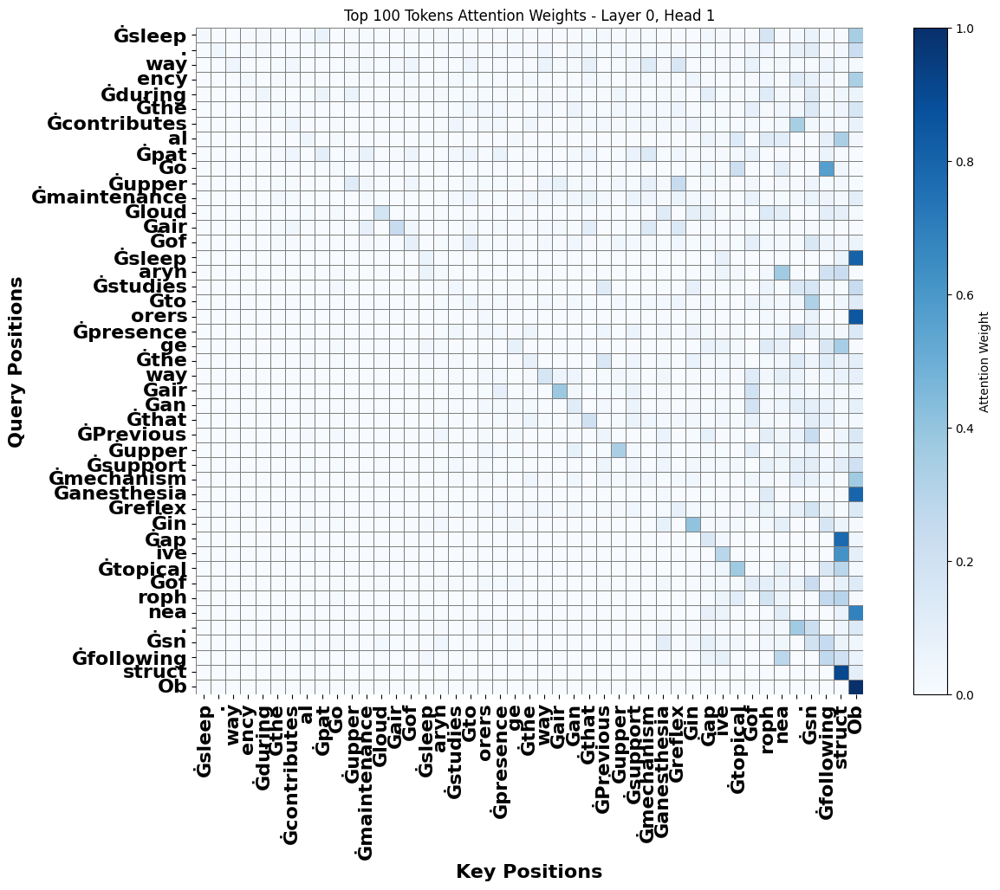

In [9]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

def visualize_attention(model, tokenizer, text, layer_idx=-1, head_idx=0, top_n_tokens=150, filename="attention_heatmap.jpg"):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()

    inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=512).to(device)

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    attentions = outputs.attentions
    attention_matrix = attentions[layer_idx][0, head_idx].cpu().numpy()

    tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

    avg_attention = attention_matrix.mean(axis=0)
    top_indices = np.argsort(avg_attention)[-top_n_tokens:]
    top_tokens = [tokens[i] for i in top_indices]
    top_attention_matrix = attention_matrix[np.ix_(top_indices, top_indices)]
    df = pd.DataFrame(top_attention_matrix, index=top_tokens, columns=top_tokens)
    df.to_csv("lora_med_txt_gen_top_attention_matrix.csv")
    plt.figure(figsize=(15, 10))
    # Create the heatmap and store the result (QuadMesh object)
    heatmap = sns.heatmap(
        top_attention_matrix,
        cmap="Blues",
        linewidths=0.5,
        linecolor="gray",
        square=True,
        cbar=False,
        vmin=0, vmax=1,
        xticklabels=top_tokens, yticklabels=top_tokens
    )
    plt.xticks(rotation=90, fontsize=16, fontweight='bold')
    plt.yticks(fontsize=16, fontweight='bold')
    plt.xlabel("Key Positions", fontsize=16, fontweight='bold')
    plt.ylabel("Query Positions", fontsize=16, fontweight='bold')
    plt.title(f"Top {top_n_tokens} Tokens Attention Weights - Layer {layer_idx+1}, Head {head_idx+1}")
    plt.colorbar(heatmap.collections[0], label="Attention Weight") # Pass the QuadMesh object to colorbar

    plt.savefig(filename)
    plt.show()
text = "Obstructive sleep apnea following topical oropharyngeal anesthesia in loud snorers. Previous studies support the presence of an upper airway reflex mechanism that contributes to the maintenance of upper airway patency during sleep."

# Example usage
visualize_attention(generator_model, tokenizer, text, layer_idx=-1, head_idx=0, top_n_tokens=100, filename="lora_med_txt_gen_attn_map.jpg")


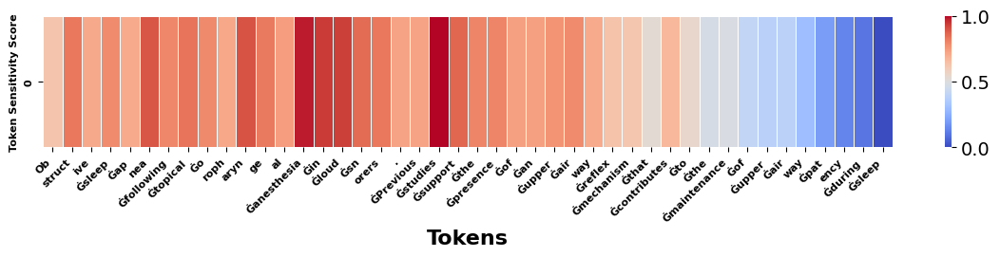

In [13]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
def compute_token_sensitivity(text):
    """Compute token sensitivity by measuring logit differences when modifying tokens."""
    tokens = tokenizer(text, return_tensors="pt", add_special_tokens=True).to("cuda")
    input_ids = tokens["input_ids"]

    with torch.no_grad():
        base_logits = generator_model(**tokens).logits[:, :-1, :]  # Exclude final token prediction

    sensitivities = []

    for i in range(input_ids.shape[1] - 1):  # Exclude last token
        perturbed_ids = input_ids.clone()
        perturbed_ids[:, i] = tokenizer.eos_token_id  # Use end-of-text token instead of MASK

        with torch.no_grad():
            perturbed_logits = generator_model(input_ids=perturbed_ids).logits[:, :-1, :]

        # Compute sensitivity as logit difference norm
        diff = torch.norm(base_logits - perturbed_logits, dim=-1).mean().item()
        sensitivities.append(diff)

    # Normalize scores to [0,1]
    sensitivities = np.array(sensitivities)
    sensitivities = (sensitivities - sensitivities.min()) / (sensitivities.max() - sensitivities.min() + 1e-8)

    return tokenizer.convert_ids_to_tokens(input_ids[0][:-1].tolist()), sensitivities

def plot_token_sensitivity(text, threshold_high=0.7, threshold_low=0.3):
    """
    Plot heatmap for token sensitivity visualization, highlighting high and low sensitivity tokens.

    Args:
        text: The input text string.
        threshold_high: Threshold for considering a token as having high sensitivity (between 0 and 1).
        threshold_low: Threshold for considering a token as having low sensitivity (between 0 and 1).
    """
    tokens, scores = compute_token_sensitivity(text)

    # Identify high and low sensitivity tokens
    high_sensitive_tokens = [
        (token, score) for token, score in zip(tokens, scores) if score >= threshold_high
    ]
    low_sensitive_tokens = [
        (token, score) for token, score in zip(tokens, scores) if score <= threshold_low
    ]

    # Print high and low sensitive tokens
    #print("High Sensitivity Tokens (Sensitivity >= {:.2f}):".format(threshold_high))
    #for token, score in high_sensitive_tokens:
    #    print(f"  {token}: {score:.2f}")

    #print("\nLow Sensitivity Tokens (Sensitivity <= {:.2f}):".format(threshold_low))
    #for token, score in low_sensitive_tokens:
    #    print(f"  {token}: {score:.2f}")

   # Create a list of labels for the heatmap
    labels =[]
    # Create a new list of scores, where intermediate sensitivity tokens are masked
    masked_scores =[]
    for i, score in enumerate(scores):
        if 0.3 <= score <= 1.0 or 0.0 <= score <= 0.3:
            masked_scores.append(score)
            labels.append(tokens[i])  # Keep the label for high/low sensitivity
        else:
            masked_scores.append(np.nan)  # Use NaN to mask intermediate values
            labels.append("")  # Empty string for intermediate sensitivity


    plt.figure(figsize=(12, 3))
    sns.heatmap([masked_scores], cmap="coolwarm", linewidths=0.5, cbar=True,
                mask=np.isnan([masked_scores]))  # Use mask to hide NaN cells
    plt.xticks(ticks=np.arange(len(tokens)) + 0.5, labels=labels, rotation=45, ha="right", fontweight="bold", fontsize=8)
    plt.xlabel("Tokens",fontweight="bold",fontsize=16)
    plt.yticks(fontweight="bold",fontsize=8)
    plt.ylabel("Token Sensitivity Score",fontweight="bold",fontsize=8)
    plt.title("")
    plt.tight_layout()
    plt.savefig('lora_med_txt_gen_tkn_smap.jpg')
    plt.show()
text = "Obstructive sleep apnea following topical oropharyngeal anesthesia in loud snorers. Previous studies support the presence of an upper airway reflex mechanism that contributes to the maintenance of upper airway patency during sleep."
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
generator_model.to(device)
generator_model.eval()
plot_token_sensitivity(text)

tarining: Tissue changes around loose prostheses. A canine model to investigate the effects of an antiinflammatory agent.
generated:  an antiinflammatory agent. The effects of a topical antiinflammatory agent on the tissue changes around loose prostheses were studied in a canine model. The prostheses were placed in the dorsal and ventral regions of the hind limb. The prostheses were placed in the dorsal region of the hind limb and the ventral region of the hind limb. The prostheses were placed in the dorsal region of the hind limb and the vent


C:\Users\my pc\AppData\Local\Temp\ipykernel_6484\3907421551.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=train_tokens, y=train_entropy, palette=colors_train, ax=axes[0])
C:\Users\my pc\AppData\Local\Temp\ipykernel_6484\3907421551.py:56: UserWarning: The palette list has more values (21) than needed (20), which may not be intended.
  sns.barplot(x=train_tokens, y=train_entropy, palette=colors_train, ax=axes[0])
C:\Users\my pc\AppData\Local\Temp\ipykernel_6484\3907421551.py:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(train_tokens, rotation=90)
C:\Users\my pc\AppData\Local\Temp\ipykernel_6484\3907421551.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

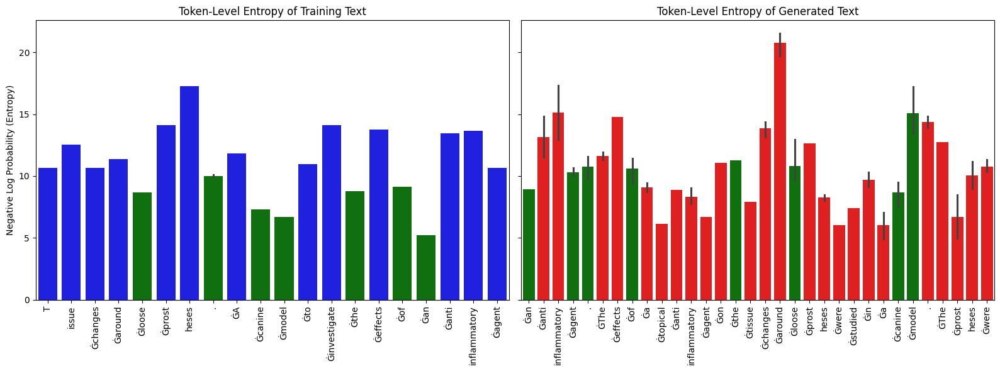

In [72]:
import torch
import torch.nn.functional as F
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
generator_model.to(device)

# Training Text
training_text = "Tissue changes around loose prostheses. A canine model to investigate the effects of an antiinflammatory agent."

# Generate synthetic text
input_ids = tokenizer.encode(training_text, return_tensors="pt").to(device)
output_ids = generator_model.generate(input_ids, max_length=100, pad_token_id=tokenizer.eos_token_id)
generated_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)

# Tokenize texts
train_tokens = tokenizer.tokenize(training_text)
gen_tokens = tokenizer.tokenize(generated_text)
# Make sure train and gen texts have similar lengths before encoding
train_tokens = train_tokens[:min(len(train_tokens), len(gen_tokens))]
gen_tokens = gen_tokens[16:len(gen_tokens)]

# Convert back to string and encode again
training_text = tokenizer.convert_tokens_to_string(train_tokens)
generated_text = tokenizer.convert_tokens_to_string(gen_tokens)
# Function to compute token probabilities
def get_token_probabilities(text, model, tokenizer):
    input_ids = tokenizer.encode(text, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
    logits = outputs.logits
    probs = F.softmax(logits, dim=-1)
    token_probs = [probs[0, i, token_id].item() for i, token_id in enumerate(input_ids[0])]
    return token_probs, tokenizer.convert_ids_to_tokens(input_ids[0])
print("tarining:",training_text)
print("generated:",generated_text)
# Compute token probabilities and entropy
train_probs, train_tokens = get_token_probabilities(training_text, generator_model, tokenizer)
gen_probs, gen_tokens = get_token_probabilities(generated_text, generator_model, tokenizer)
train_entropy = [-np.log(p) for p in train_probs]
gen_entropy = [-np.log(p) for p in gen_probs]

# Identify memorized tokens (common in both texts & entropy < threshold)
threshold = 10  # Adjust threshold as needed
memorized_tokens = set(train_tokens) & set(gen_tokens)
memorized_indices_train = [i for i, token in enumerate(train_tokens) if token in memorized_tokens and train_entropy[i] < threshold]
memorized_indices_gen = [i for i, token in enumerate(gen_tokens) if token in memorized_tokens and gen_entropy[i] < threshold]

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Training Text Plot
colors_train = ['green' if i in memorized_indices_train else 'blue' for i in range(len(train_tokens))]
sns.barplot(x=train_tokens, y=train_entropy, palette=colors_train, ax=axes[0])
axes[0].set_title("Token-Level Entropy of Training Text")
axes[0].set_ylabel("Negative Log Probability (Entropy)")
axes[0].set_xticklabels(train_tokens, rotation=90)

# Generated Text Plot
colors_gen = ['green' if i in memorized_indices_gen else 'red' for i in range(len(gen_tokens))]
sns.barplot(x=gen_tokens, y=gen_entropy, palette=colors_gen, ax=axes[1])
axes[1].set_title("Token-Level Entropy of Generated Text")
axes[1].set_xticklabels(gen_tokens, rotation=90)

plt.tight_layout()
plt.savefig('lora_med_txt_gen_tkn_mem.jpg')
plt.show()


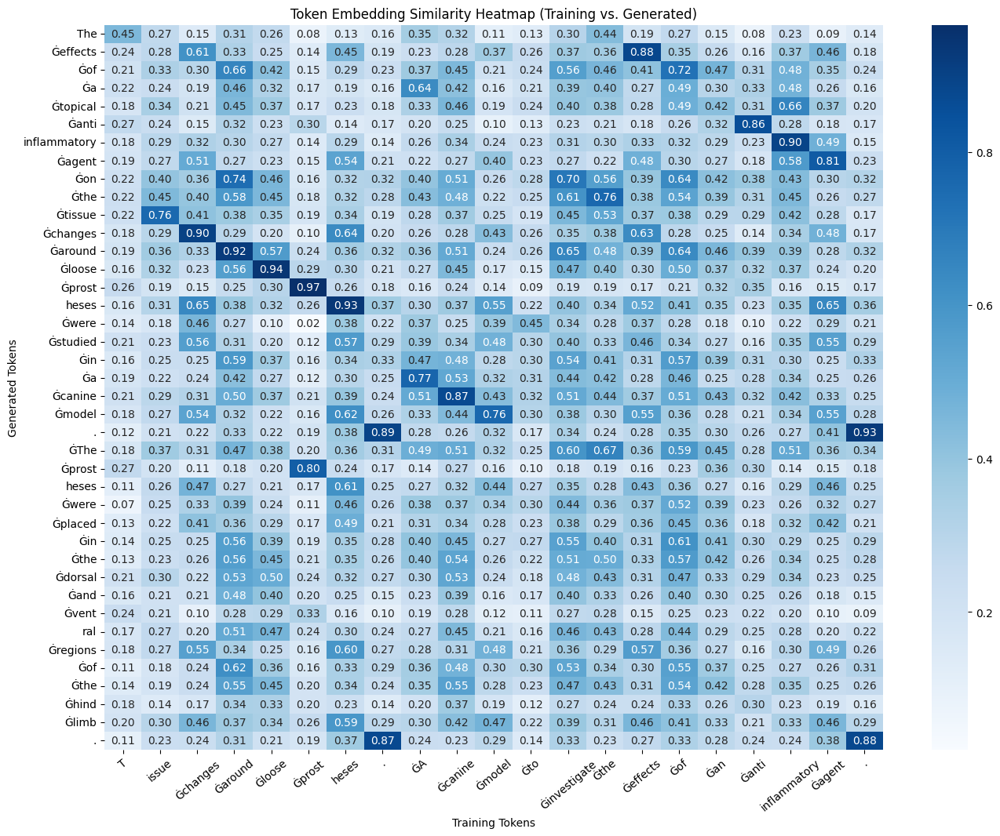

In [13]:
import torch
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from transformers import AutoTokenizer, AutoModel
generator_model.to(device)
# Example Training & Generated Texts
training_text = "Tissue changes around loose prostheses. A canine model to investigate the effects of an antiinflammatory agent."
generated_text = "The effects of a topical antiinflammatory agent on the tissue changes around loose prostheses were studied in a canine model. The prostheses were placed in the dorsal and ventral regions of the hind limb."

train_tokens = tokenizer.tokenize(training_text)
gen_tokens = tokenizer.tokenize(generated_text)

# Function to Get Token Embeddings
def get_token_embeddings(tokens):
    input_ids = tokenizer.convert_tokens_to_ids(tokens)
    input_tensor = torch.tensor([input_ids]).to(device)  # Move to GPU if available

    with torch.no_grad():
        outputs = generator_model(input_tensor, output_hidden_states=True)  # Get hidden states
        hidden_states = outputs.hidden_states[-1]  # Extract last layer hidden states
    
    return hidden_states.squeeze(0).cpu().numpy()  # Convert to numpy


# Compute Token Embeddings
train_embeddings = get_token_embeddings(train_tokens)
gen_embeddings = get_token_embeddings(gen_tokens)

# Compute Cosine Similarity Matrix
similarity_matrix = cosine_similarity(gen_embeddings, train_embeddings)

# Plot Heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(similarity_matrix, annot=True, cmap="Blues", xticklabels=train_tokens, yticklabels=gen_tokens, fmt=".2f")

plt.xlabel("Training Tokens")
plt.ylabel("Generated Tokens")
plt.title("Token Embedding Similarity Heatmap (Training vs. Generated)")
plt.xticks(rotation=40)
plt.yticks(rotation=0)
plt.savefig('lora_med_txt_gen_tkn_similarity.jpg')
plt.show()
